In [1]:
import pickle

import chpobench

import matplotlib.pyplot as plt

import numpy as np

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams['mathtext.fontset'] = 'stix'  # The setting of math font

In [2]:
results = pickle.load(open("ctpe-experiments.pkl", mode="rb"))

## Plot Strategy
I performed the grid search over:
1. Algorithms (c-TPE with linear gamma, c-TPE with sqrt gamma, original constrained TPE),
2. Benchmarks (JAHS-Bench-201, HPOLib, and HPOBench each with 1 dataset), and
3. Two constraints with different constraint levels ({None, 0.01, 0.1, 0.5, 0.9} x {None, 0.01, 0.1, 0.5, 0.9} where I did not run None and None because it is just a single-objective optimization).

Based on the description above, there must be 72 setups, but I removed one setup where the benchmark did not have any feasible solution, so I conducted 71 setups in total.
Each setup was run over 20 different random seeds.

For each of them, I will plot:
1. Number of feasible solutions over time, and
2. The best performance over time with a standard error band, which removed infeasible solutions.

In [3]:
PREFIXES = ["ctpe-sqrt-", "ctpe-linear-", "original-linear-"]
ALGO_DICT = {
    "ctpe-sqrt-": "c-TPE (sqrt)",
    "ctpe-linear-": "c-TPE (lienar)",
    "original-linear-": "Original",
}
COLOR_DICT = {
    "ctpe-sqrt-": "red",
    "ctpe-linear-": "blue",
    "original-linear-": "black",
}
LS_DICT = {
    "ctpe-sqrt-": "solid",
    "ctpe-linear-": "dashed",
    "original-linear-": "dotted",
}

def extract_setup_name(study_name: str) -> str:
    for prefix in PREFIXES:
        if study_name.startswith(prefix):
            return study_name.split(prefix)[1][:-3]

    assert False, "Should not be reached"

N_SEEDS = 20
SETUP_NAMES = list(set(extract_setup_name(key) for key in results.keys()))

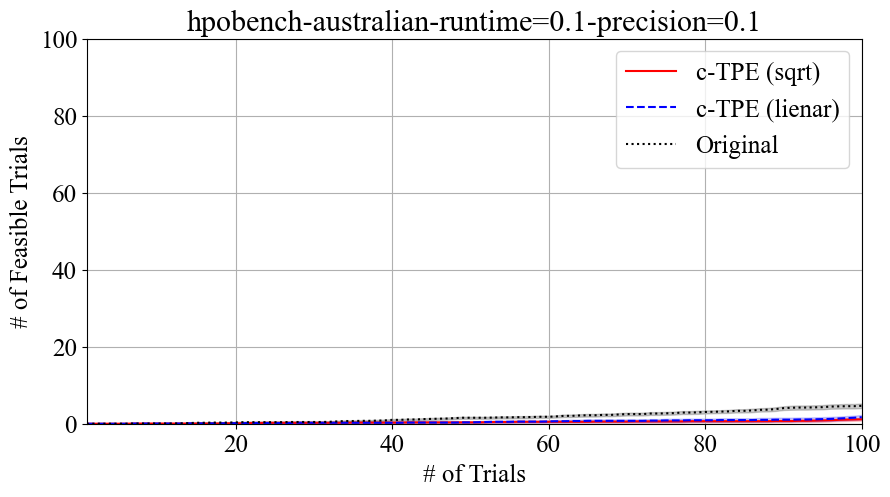

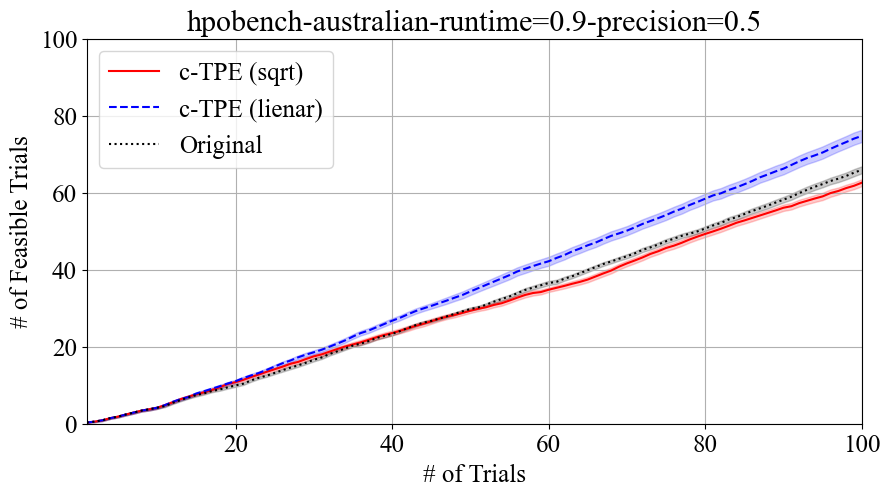

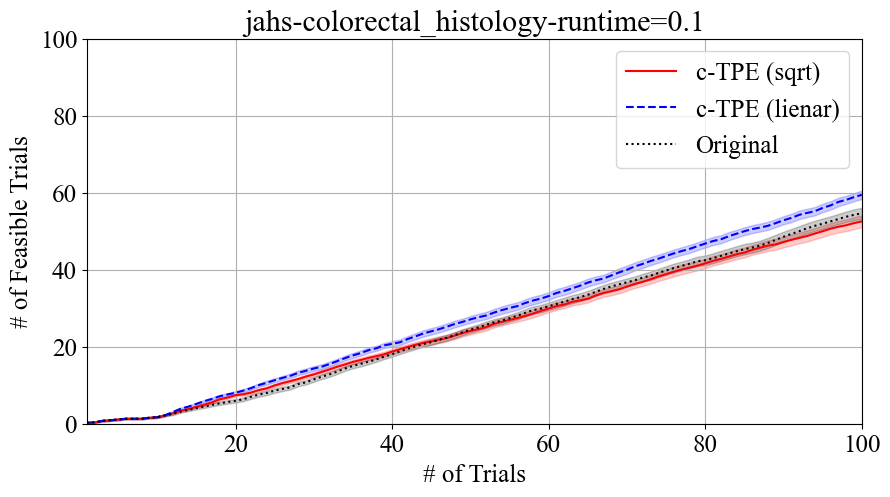

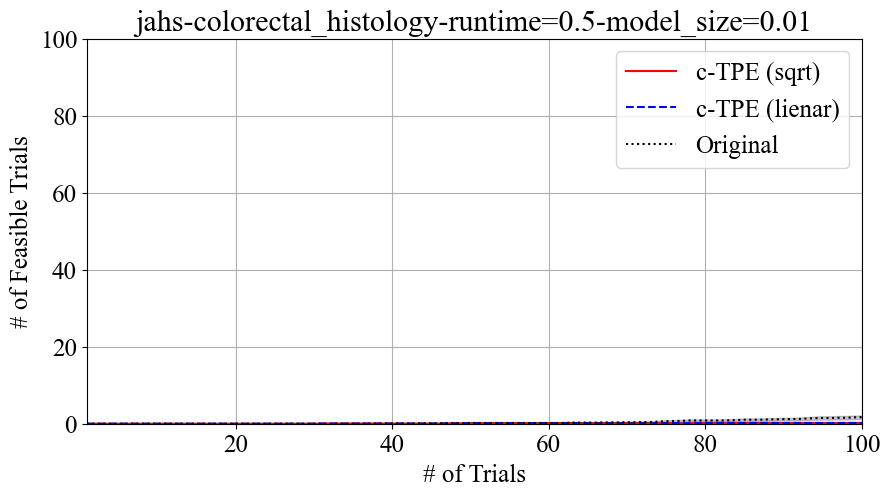

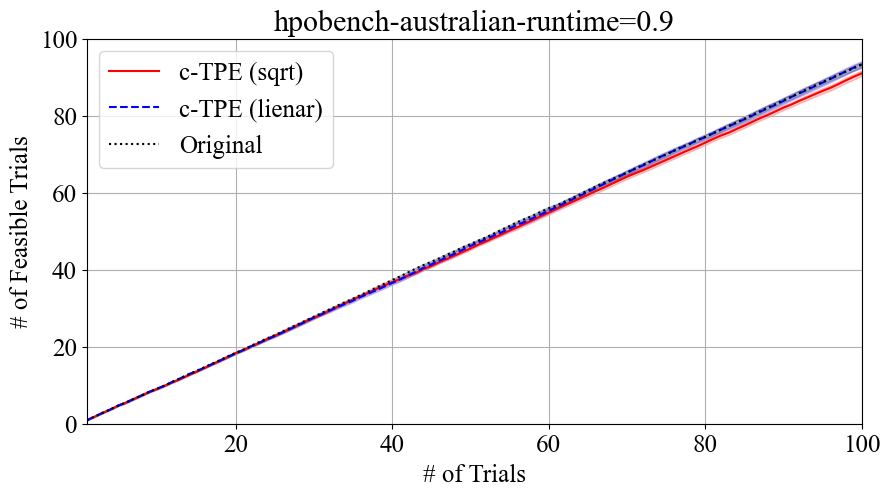

...

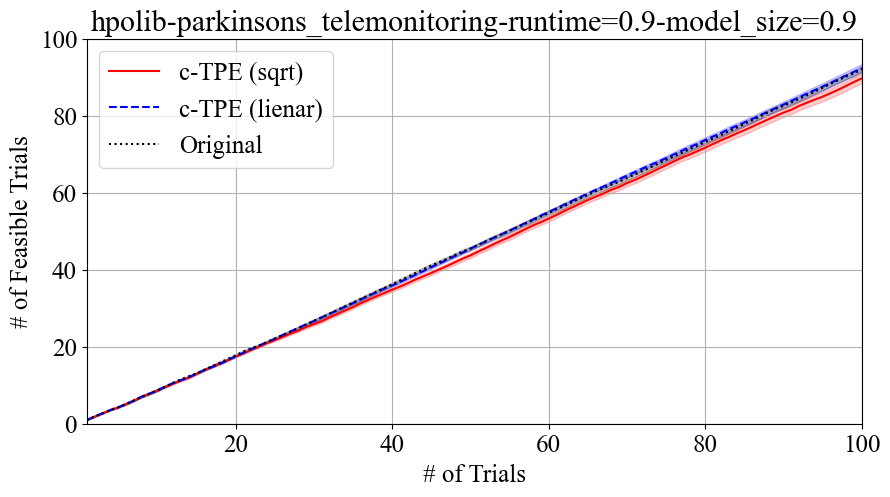

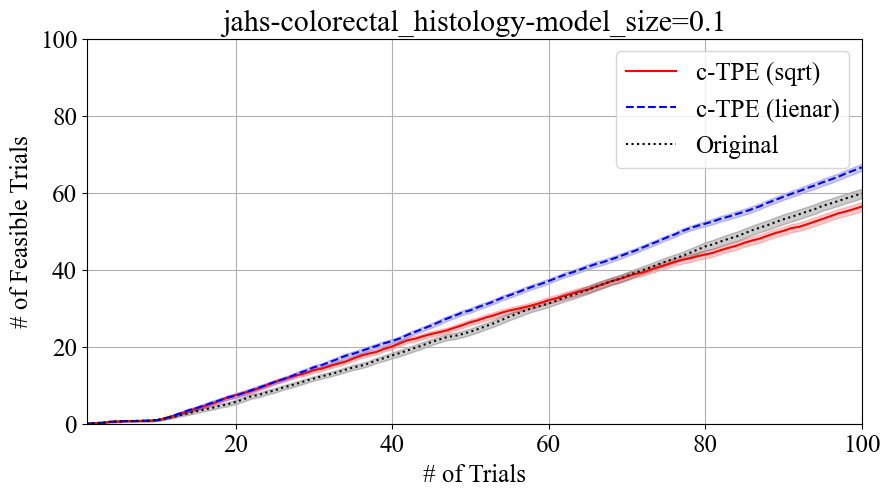

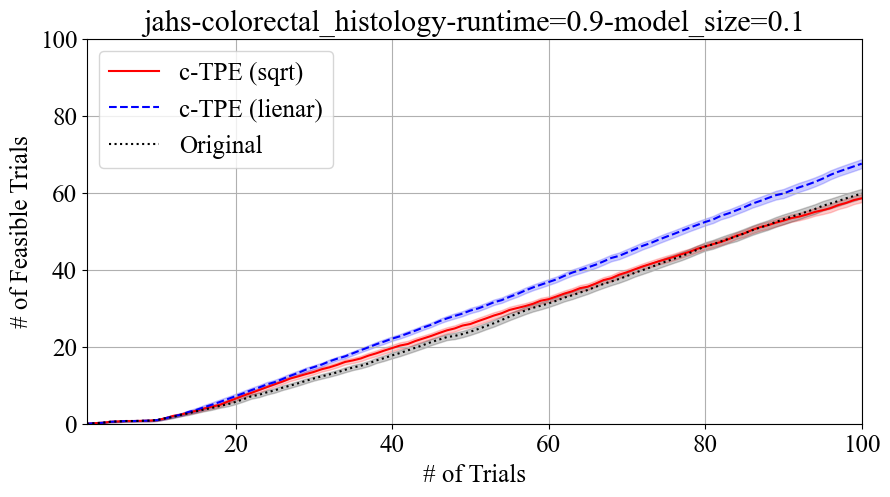

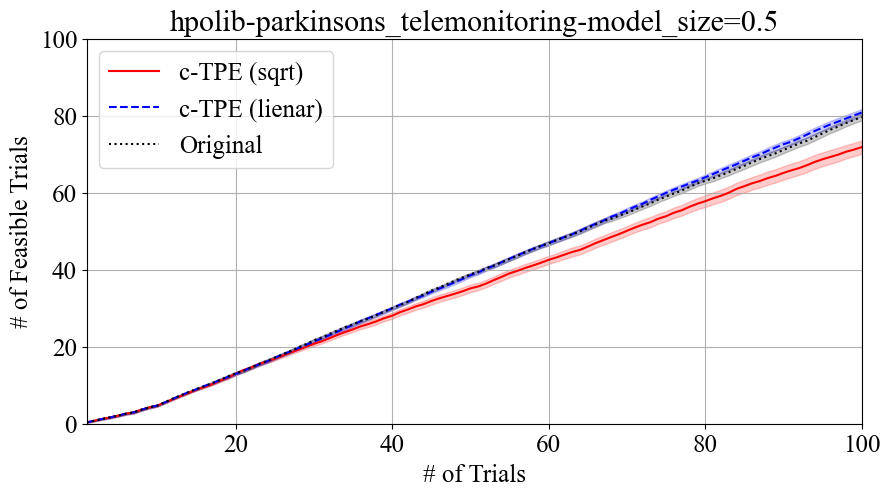

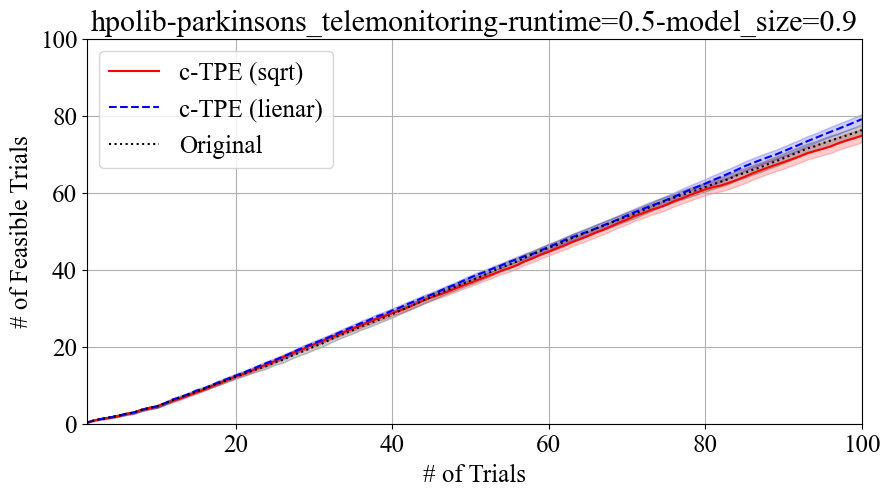

In [4]:
def plot_feasible_count(setup_name: str) -> None:
    _, ax = plt.subplots(figsize=(10, 5))
    dx = np.arange(1, 101)
    for prefix in PREFIXES:
        feasibles = np.array([results[f"{prefix}{setup_name}-{seed:0>2}"]["feasible"] for seed in range(N_SEEDS)])
        feasible_count = np.cumsum(feasibles, axis=1)
        m, s = np.mean(feasible_count, axis=0), np.std(feasible_count, axis=0) / np.sqrt(N_SEEDS)
        ax.plot(dx, m, ls=LS_DICT[prefix], color=COLOR_DICT[prefix], label=ALGO_DICT[prefix])
        ax.fill_between(dx, m - s, m + s, color=COLOR_DICT[prefix], alpha=0.2)

    ax.set_xlabel("# of Trials")
    ax.set_ylabel("# of Feasible Trials")
    ax.set_title(setup_name)
    ax.set_xlim(1, 100)
    ax.set_ylim(0, 100)
    ax.grid()
    ax.legend()
    plt.show()

for i, setup_name in enumerate(SETUP_NAMES):
    plot_feasible_count(setup_name)

/tmp/ipykernel_299531/2396995612.py:54: RuntimeWarning: Mean of empty slice
  m, s = np.nanmean(obj_vals, axis=0)[mask], np.nanstd(obj_vals, axis=0)[mask] / np.sqrt(seed_count)[mask]


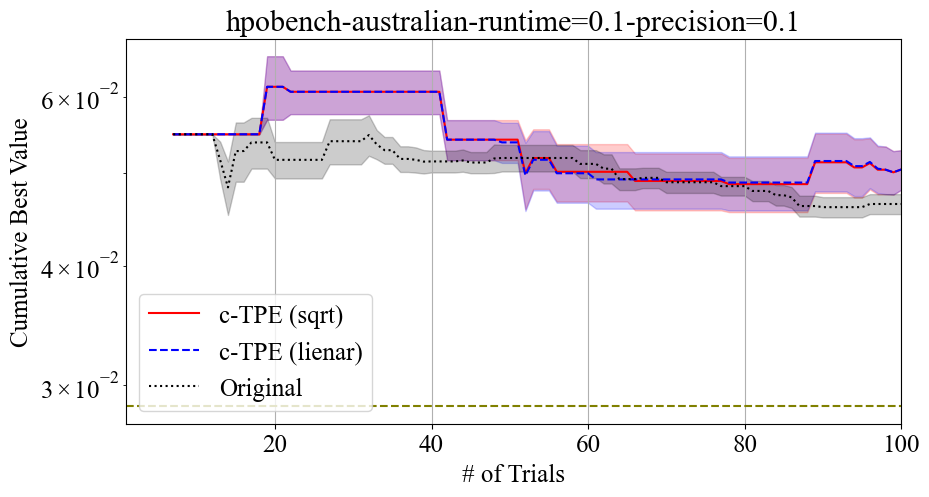

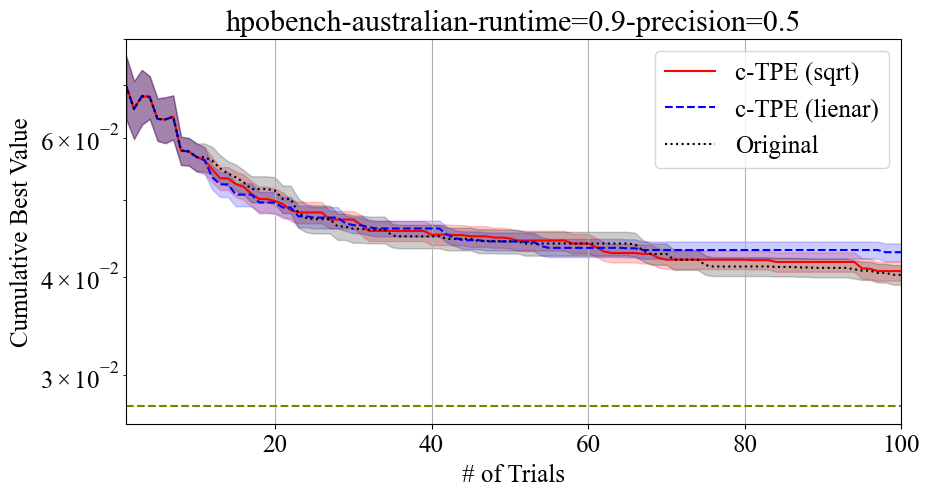

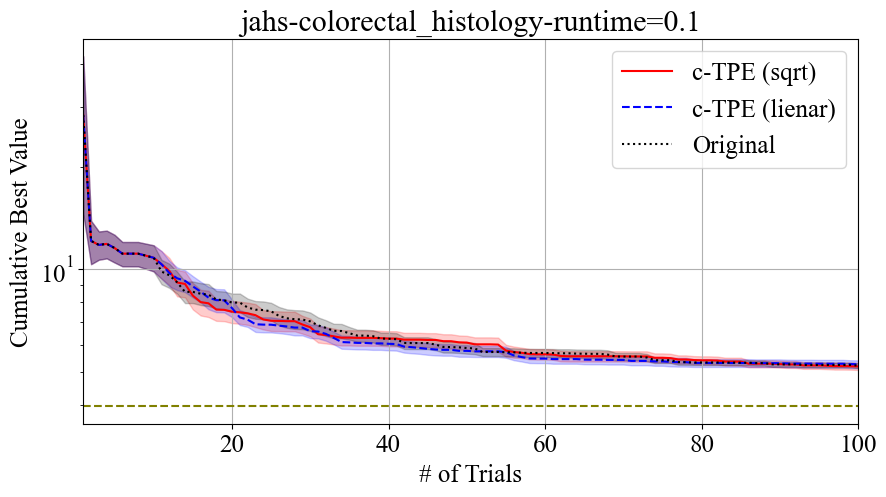

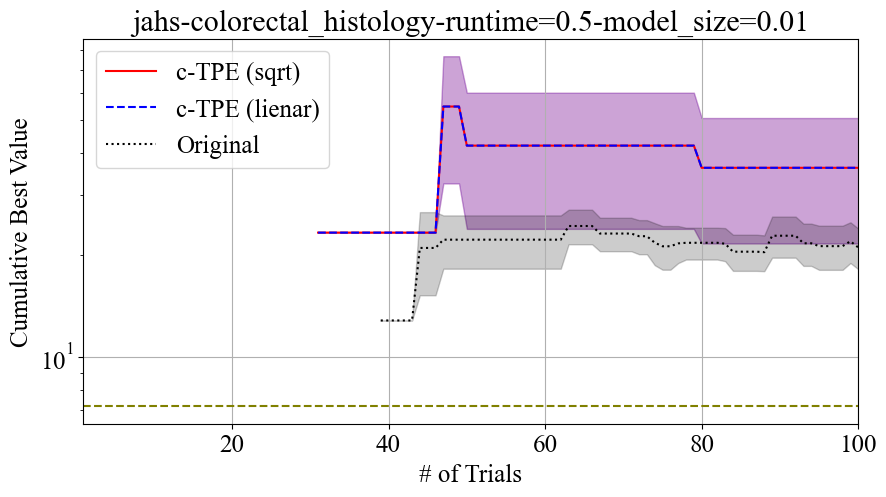

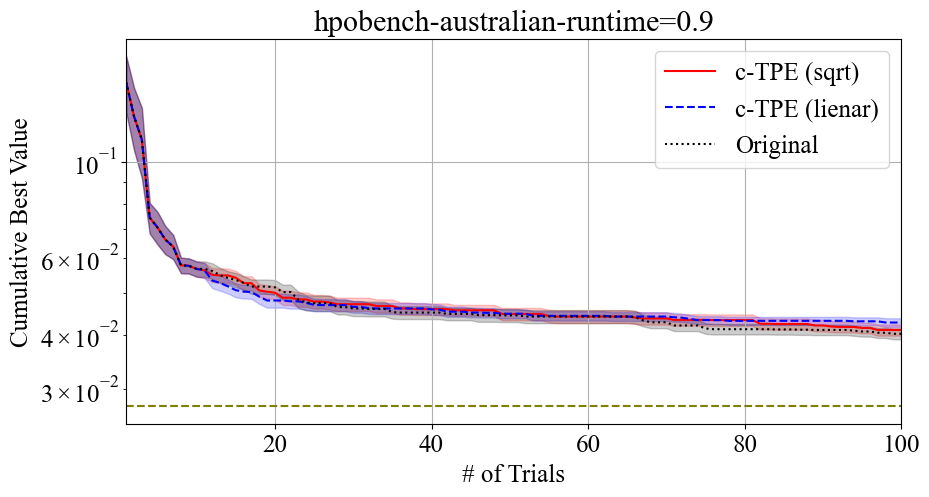

...

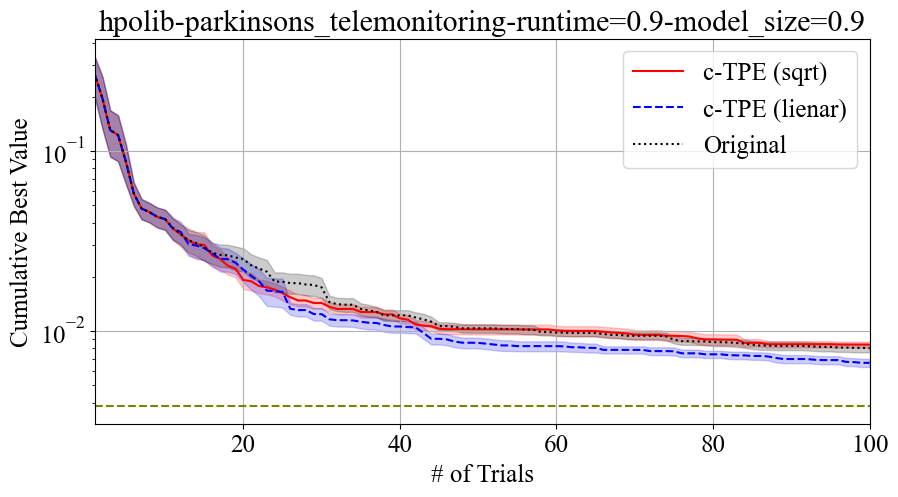

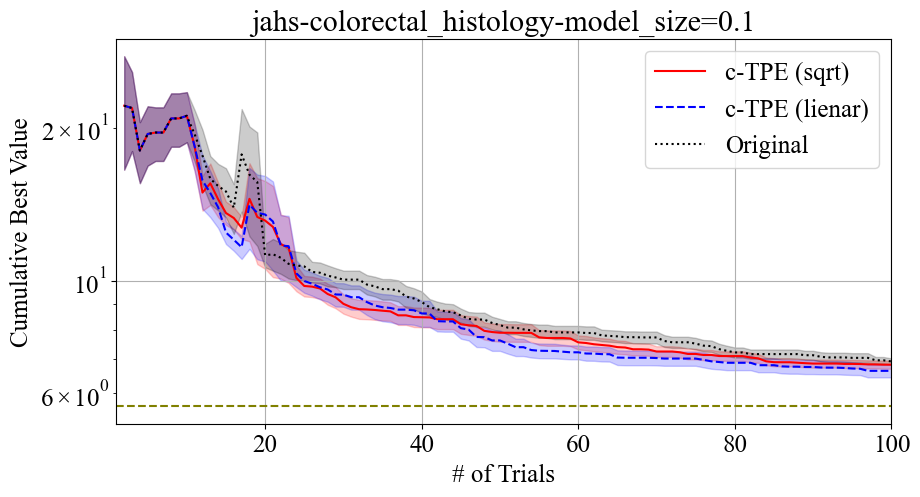

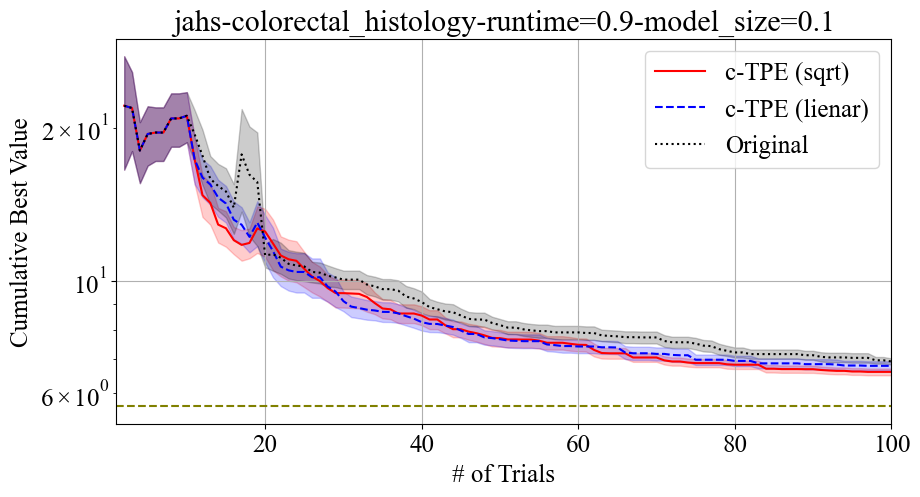

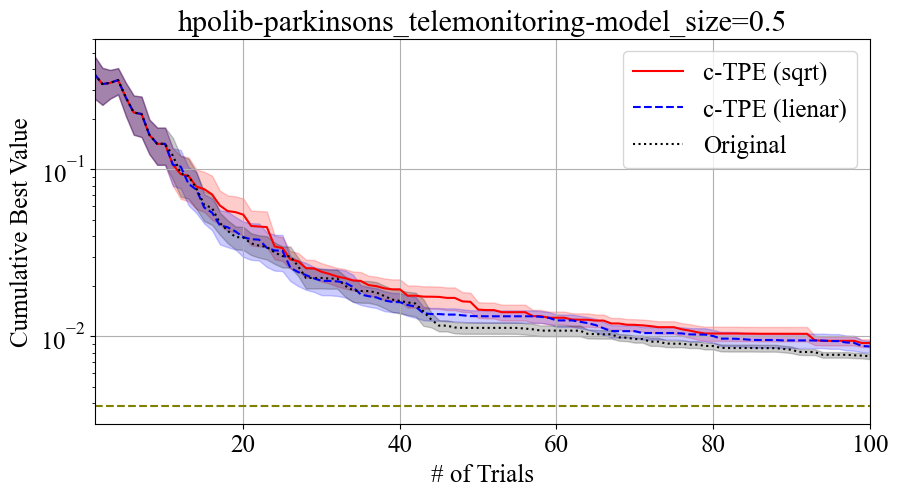

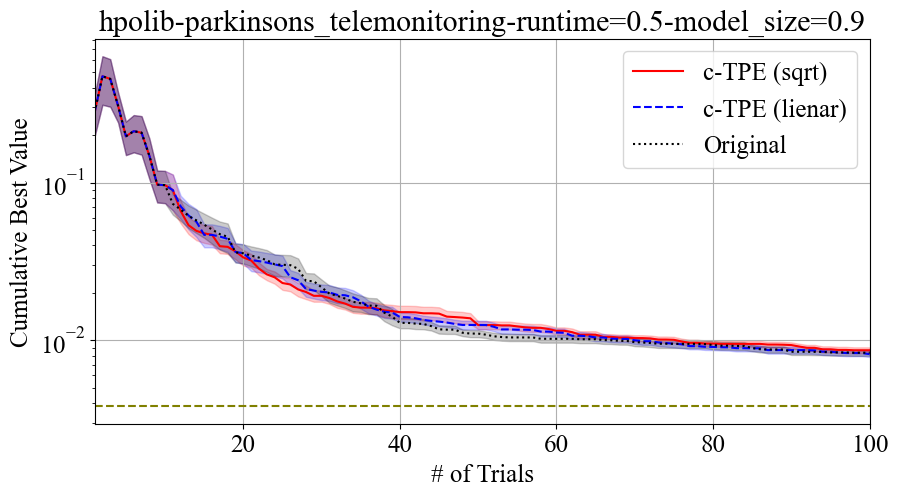

In [6]:
def get_optimal_val(setup_name: str) -> float:
    if "jahs" in setup_name:
        bench_cls = chpobench.JAHSBench201
        data_path = "/home/shuhei/hpo_benchmarks/jahs"
    elif "hpolib" in setup_name:
        bench_cls = chpobench.HPOLib
        data_path = "/home/shuhei/hpo_benchmarks/hpolib"
    else:
        bench_cls = chpobench.HPOBench
        data_path = "/home/shuhei/hpo_benchmarks/hpobench"

    info = bench_cls(
        data_path=data_path,
        dataset_name=bench_cls.dataset_names[0],
        metric_names=[],
        quantiles={}
    ).constraint_info

    if "model_size" in setup_name:
        q = float(setup_name.split("model_size=")[1].split("-")[0])
        info = info[info["model_size_quantile"] == q]
    elif "hpobench" not in setup_name:
        info = info[info["model_size_quantile"] == 1.0]
    if "precision" in setup_name:
        q = float(setup_name.split("precision=")[1].split("-")[0])
        info = info[info["precision_quantile"] == q]
    elif "hpobench" in setup_name:
        info = info[info["precision_quantile"] == 1.0]
    if "runtime" in setup_name:
        q = float(setup_name.split("runtime=")[1].split("-")[0])
        info = info[info["runtime_quantile"] == q]
    else:
        info = info[info["runtime_quantile"] == 1.0]

    assert len(info) == 1, info
    return info.iloc[0].optimal_val


def plot_perf(setup_name: str) -> None:
    _, ax = plt.subplots(figsize=(10, 5))
    dx = np.arange(1, 101)

    optimal_val = get_optimal_val(setup_name)
    ax.hlines(optimal_val, 1, 100, color="olive", linestyle="dashed")
    for prefix in PREFIXES:
        feasibles = np.array([results[f"{prefix}{setup_name}-{seed:0>2}"]["feasible"] for seed in range(N_SEEDS)])
        obj_vals = np.array([results[f"{prefix}{setup_name}-{seed:0>2}"]["loss"] for seed in range(N_SEEDS)])
        obj_vals[~feasibles] = np.inf
        obj_vals = np.minimum.accumulate(obj_vals, axis=1)
        obj_vals[obj_vals == np.inf] = np.nan

        seed_count = np.sum(~np.isnan(obj_vals), axis=0)
        mask = seed_count >= 1
        m, s = np.nanmean(obj_vals, axis=0)[mask], np.nanstd(obj_vals, axis=0)[mask] / np.sqrt(seed_count)[mask]

        ax.plot(dx[mask], m, ls=LS_DICT[prefix], color=COLOR_DICT[prefix], label=ALGO_DICT[prefix])
        ax.fill_between(dx[mask], m - s, m + s, color=COLOR_DICT[prefix], alpha=0.2)

    ax.set_xlabel("# of Trials")
    ax.set_ylabel("Cumulative Best Value")
    ax.set_title(setup_name)
    ax.set_xlim(1, 100)
    ax.grid()
    ax.set_yscale("log")
    ax.legend()
    plt.show()

for i, setup_name in enumerate(SETUP_NAMES):
    plot_perf(setup_name)